In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
# Path to segmentation masks
# segmentation_path = "/itet-stor/mrichte/covlus_bmicnas02/cropped_videos_segmented/post_processing"
segmentation_path = "/Users/matthiasrichter/Library/CloudStorage/OneDrive-Personal/Studium/Masterthesis/Sample"

# List all files & directories
seg_files = os.listdir(segmentation_path)

# keep only .gif files that end with _mask
seg_mask_files = [x for x in seg_files if x.endswith(".npy")]

print(f"Found {len(seg_mask_files)} segmentation masks")

Found 1 segmentation masks


In [3]:
FILE_NO = 0
array = np.load(os.path.join(segmentation_path, seg_mask_files[FILE_NO]))
print(array.shape)

(99, 800, 2000)


In [4]:
def scale_down(array, size):
    """Scale down an array using bilinear interpolation.

    Parameters
    ----------
    array : numpy.ndarray
        The array to scale down.
    size : tuple
        The size of the scaled array.

    Returns
    -------
    numpy.ndarray
        The scaled array.
    """
    
    # Compute the scaling factor
    height, width = array.shape
    scaling_factor = min(size[0] / height, size[1] / width)
    
    # Compute the size of the scaled image
    scaled_height = int(height * scaling_factor)
    scaled_width = int(width * scaling_factor)
    
    # Create a scaled image using bilinear interpolation
    scaled_array = np.empty((scaled_height, scaled_width))
    for i in range(scaled_height):
        for j in range(scaled_width):
            # Compute the coordinates of the corresponding pixel in the original image
            x = i / scaling_factor
            y = j / scaling_factor
            
            # Get the four nearest pixels in the original image
            x0 = int(np.floor(x))
            x1 = x0 + 1
            y0 = int(np.floor(y))
            y1 = y0 + 1
            
            # Check if the coordinates are within the bounds of the original image
            if x0 < 0 or x0 >= height or y0 < 0 or y0 >= width or x1 < 0 or x1 >= height or y1 < 0 or y1 >= width:
                continue
            
            # Compute the weights for each pixel
            wx1 = x1 - x
            wx0 = x - x0
            wy1 = y1 - y
            wy0 = y - y0
            
            # Compute the value of the pixel in the scaled image using bilinear interpolation
            scaled_array[i, j] = (array[x0, y0] * wx1 * wy1 + array[x1, y0] * wx0 * wy1 + array[x0, y1] * wx1 * wy0 + array[x1, y1] * wx0 * wy0)
    
    return scaled_array


Size of the scaled image: (80, 200)


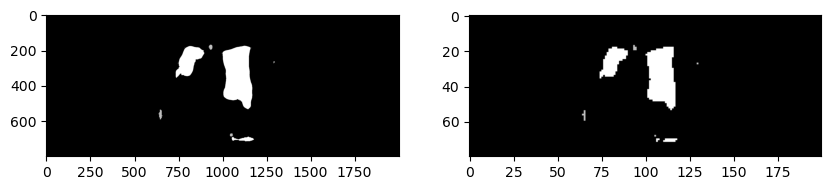

In [5]:
SCALE_FACTOR = 0.1
SIZE = (int(array.shape[1] * SCALE_FACTOR), int(array.shape[2] * SCALE_FACTOR))
print("Size of the scaled image:", SIZE)
# SIZE = (200, 500)

# Scale down the first frame for testing
first_frame = array[0]
frame_scaled = scale_down(first_frame, SIZE)

# Subplotting the original and the scaled image side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.imshow(first_frame, cmap="gray")
ax2.imshow(frame_scaled, cmap="gray")
plt.show()

Size of the scaled image: (80, 200)


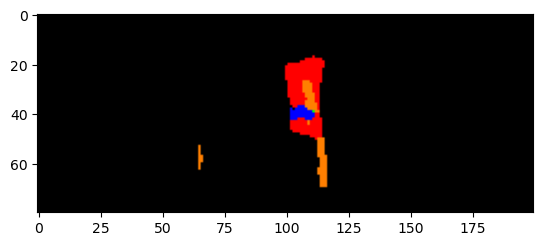

In [28]:
SCALE_FACTOR = 0.1
SIZE = (int(array.shape[1] * SCALE_FACTOR), int(array.shape[2] * SCALE_FACTOR))
print("Size of the scaled image:", SIZE)
# SIZE = (200, 500)

# Scale down the first frame for testing
first_frame = array[30]
frame_scaled = scale_down(first_frame, SIZE)

# Plot all 0 as black, all 1 as blue, all 2 as green, all 3 as orange, all 4 as red

# Transform frame_scaled into rgb image
frame_rgb = np.zeros((frame_scaled.shape[0], frame_scaled.shape[1], 3))
for i in range(frame_scaled.shape[0]):
    for j in range(frame_scaled.shape[1]):
        if frame_scaled[i, j] == 0:
            frame_rgb[i, j, :] = [0, 0, 0]
        elif frame_scaled[i, j] == 1:
            frame_rgb[i, j, :] = [0, 0, 1]
        elif frame_scaled[i, j] == 2:
            frame_rgb[i, j, :] = [0, 1, 0]
        elif frame_scaled[i, j] == 3:
            frame_rgb[i, j, :] = [1, 0.5, 0]
        elif frame_scaled[i, j] == 4:
            frame_rgb[i, j, :] = [1, 0, 0]

# Plot the rgb image
plt.imshow(frame_rgb)

In [29]:
# Scale down all images in the array
# Create a new array with the scaled images
scaled_array = np.empty((array.shape[0], SIZE[0], SIZE[1]))

for i in range(array.shape[0]):
    scaled_array[i] = scale_down(array[i], SIZE)

print(scaled_array.shape)

(99, 80, 200)


In [30]:
import numpy as np

def array_to_point_cloud(array, seg_class):
    """Convert a segmentation mask to a point cloud. The point cloud is a numpy array with shape (num_points, 3). 
    Considers only one segementation class defined by seg_class.

    Parameters
    ----------
    array : numpy.ndarray
        The segmentation mask.
    seg_class : int
        The class of the segmentation mask.

    Returns
    -------
    numpy.ndarray
        The point cloud.
    """

    # Check if seg_class is a valid value (1,2,3,4)
    if seg_class < 1 or seg_class > 4:
        raise ValueError("Cluster must be a value between 1 and 4")
    # Extract the indices of all the values that are in the cluster
    indices = np.argwhere(array == seg_class)
    
    # Convert the indices to a point cloud
    point_cloud = indices.reshape(-1, 3)

    
    return point_cloud

def get_pointclouds(array):
    """Convert a segmentation mask to a point cloud. The point cloud is a numpy array with shape (num_points, 3).
    Extracts the pointclouds for all 4 clusters and stores them in a dictionary.

    Parameters
    ----------
    array : numpy.ndarray
        The segmentation mask.

    Returns
    -------
    dict
        A dictionary with the point clouds for each cluster.
    """

    # Create a list to store the point clouds
    point_clouds = {}
    
    # Iterate over all the clusters
    for i in range(1, 5):
        # Convert the array to a point cloud
        point_cloud = array_to_point_cloud(array, i)
        # Store the point cloud in the dictionary
        point_clouds[i] = point_cloud
    
    return point_clouds


# Convert the array to a point cloud
point_clouds = get_pointclouds(array)
print(point_clouds[1].shape)  # Output: (num_points, 3)

point_clouds_scaled = get_pointclouds(scaled_array)
print(point_clouds_scaled[1].shape)  # Output: (num_points, 3)

clusters = [1,2,3,4]

(525218, 3)
(5244, 3)


In [31]:
# Plot the point cloud in 3d using plotly
fig = make_subplots(rows=2, cols=2,
                    specs=[[{'is_3d': True}, {'is_3d': True}],
                           [{'is_3d': True}, {'is_3d': True}]],
                    print_grid=False)

colors = ['blue', 'green', 'orange', 'red']

for c in clusters:
  print(f"Cluster {c} has {point_clouds_scaled[c].shape[0]} points")
  fig.append_trace(
        go.Scatter3d(
        x=point_clouds_scaled[c][:, 0],
        y=point_clouds_scaled[c][:, 1],
        z=point_clouds_scaled[c][:, 2],
        mode='markers',
        marker=dict(
            size=1,
            color=colors[clusters.index(c)],
            #colorscale='Viridis',   # choose a colorscale
            opacity=0.8
        )
      ),
      row=clusters.index(c) // 2 +1, col=clusters.index(c) % 2 + 1,)
      
    

fig.update_layout(width=1000, height=600, margin=dict(r=10, l=10, b=10, t=10))
# fix the ratio in the top left subplot to be a cube
fig.update_layout(scene_aspectmode='cube')
fig.update_layout(scene2_aspectmode='cube')
fig.update_layout(scene3_aspectmode='cube')
fig.update_layout(scene4_aspectmode='cube')
fig.update_layout(scene = dict(
                    xaxis_title='T',
                    yaxis_title='X',
                    zaxis_title='Y'))
fig.update_layout(scene2 = dict(
                    xaxis_title='T',
                    yaxis_title='X',
                    zaxis_title='Y'))
fig.update_layout(scene3 = dict(
                    xaxis_title='T',
                    yaxis_title='X',
                    zaxis_title='Y'))
fig.update_layout(scene4 = dict(
                    xaxis_title='T',
                    yaxis_title='X',
                    zaxis_title='Y'))
                    
fig.show()

Cluster 1 has 5244 points
Cluster 2 has 404 points
Cluster 3 has 4943 points
Cluster 4 has 41287 points


In [32]:
# Append all the point clouds into a single array and create array with the labels
point_cloud = np.concatenate([point_clouds_scaled[1], point_clouds_scaled[2], point_clouds_scaled[3], point_clouds_scaled[4]])
labels = np.concatenate([np.ones(point_clouds_scaled[1].shape[0]), 2*np.ones(point_clouds_scaled[2].shape[0]), 3*np.ones(point_clouds_scaled[3].shape[0]), 4*np.ones(point_clouds_scaled[4].shape[0])])
# Map labels to colors
colors = ['blue', 'green', 'orange', 'red']
labels = [colors[int(i-1)] for i in labels]

In [33]:
# Plot the point cloud in 3d using plotly

fig = go.Figure(data=[go.Scatter3d(
        x=point_cloud[:, 0],
        y=point_cloud[:, 1],
        z=point_cloud[:, 2],
    mode='markers',
    marker=dict(
        size=1,
        color=labels,  
        opacity=0.2
    )
)])

fig.update_layout(scene_aspectmode='cube')
# Set size
fig.update_layout(width=1000, height=600, margin=dict(r=10, l=10, b=10, t=10))
fig.show()

# Marching cubes for 3D segmentation

In [34]:
def get_class(array, seg_class):
    """Extracts a specific cluster from the segmentation mask.

    Parameters
    ----------
    array : numpy.ndarray
        The segmentation mask.
    seg_class : int
        The class of the segmentation mask.

    Returns
    -------
    numpy.ndarray
        The cluster.
    """

    # Check if seg_class is a valid value (1,2,3,4)
    if seg_class < 1 or seg_class > 4:
        raise ValueError("Cluster must be a value between 1 and 4")
    # Create a copy of the array to avoid modifying the original array
    array = array.copy()
    # Set all the values that are not in the cluster to 0
    array[array != seg_class] = 0
    # Set all the values that are in the cluster to 1
    array[array == seg_class] = 1

    return array

def get_classes(array):
    """Extracts all the clusters from the segmentation mask.

    Parameters
    ----------
    array : numpy.ndarray
        The segmentation mask.

    Returns
    -------
    dict
        A dictionary with the clusters.
    """

    # Create a dict to store the clusters
    classes = {}
    
    # Iterate over all the clusters
    for i in range(1, 5):
        # Extract the cluster
        cluster = get_class(array, i)
        # Store the cluster in the dictionary
        classes[i] = cluster
    
    return classes

# Extract the clusters
classes = get_classes(scaled_array)
print(classes[1].shape)  # Output: (num_points, 3)

(99, 80, 200)


In [35]:
from skimage import measure

# Extract the isosurface of all clusters
vertices = {}
faces = {}
normals = {}
values = {}
for i in range(1, 5):
    # Extract the isosurface
    verts, face, norm, val = measure.marching_cubes(classes[i])
    # Store the isosurface in the dictionary
    vertices[i] = verts
    faces[i] = face
    normals[i] = norm
    values[i] = val


In [51]:
# Plot the isosurface using plotly

colors = ['blue', 'green', 'orange', 'red']

# Plot all surfaces in 4 subplots
fig = make_subplots(rows=2, cols=2, specs=[[{'is_3d': True}, {'is_3d': True}],
                                            [{'is_3d': True}, {'is_3d': True}]])
# Add the surfaces to the subplots
for i, color in enumerate(colors):
    
    fig.add_trace(go.Mesh3d(
        x=vertices[i+1][:, 0],
        y=vertices[i+1][:, 1],
        z=vertices[i+1][:, 2],
        i=faces[i+1][:, 0],
        j=faces[i+1][:, 1],
        k=faces[i+1][:, 2],
        color=color,
        opacity=0.5
    ), row=i // 2 + 1, col=i % 2 + 1)
    


fig.update_layout(scene_aspectmode='cube')
# Set size of the figure
fig.update_layout(width=900, height=600, margin=dict(r=10, l=10, b=10, t=10))
# Set aspect mode to cube
fig.update_layout(scene_aspectmode='cube')
fig.update_layout(scene2_aspectmode='cube')
fig.update_layout(scene3_aspectmode='cube')
fig.update_layout(scene4_aspectmode='cube')

# Set rotation of the figure
x, y, z = 1.2, 0.88, 0.7
fig.update_layout(scene_camera_eye=dict(x=x, y=y, z=z))
fig.update_layout(scene2_camera_eye=dict(x=x, y=y, z=z))
fig.update_layout(scene3_camera_eye=dict(x=x, y=y, z=z))
fig.update_layout(scene4_camera_eye=dict(x=x, y=y, z=z))

# Turn of the axes
fig.update_layout(scene_xaxis_showticklabels=False)
fig.update_layout(scene_yaxis_showticklabels=False)
fig.update_layout(scene_zaxis_showticklabels=False)
fig.update_layout(scene2_xaxis_showticklabels=False)
fig.update_layout(scene2_yaxis_showticklabels=False)
fig.update_layout(scene2_zaxis_showticklabels=False)
fig.update_layout(scene3_xaxis_showticklabels=False)
fig.update_layout(scene3_yaxis_showticklabels=False)
fig.update_layout(scene3_zaxis_showticklabels=False)
fig.update_layout(scene4_xaxis_showticklabels=False)
fig.update_layout(scene4_yaxis_showticklabels=False)
fig.update_layout(scene4_zaxis_showticklabels=False)

fig.show()


In [37]:
# Plot all the isosurfaces using plotly and color the clusters differently
colors = ['blue', 'green', 'orange', 'red']

fig = go.Figure(data=[go.Mesh3d(
    x=vertices[i+1][:, 0],
    y=vertices[i+1][:, 1],
    z=vertices[i+1][:, 2],
    i=faces[i+1][:, 0],
    j=faces[i+1][:, 1],
    k=faces[i+1][:, 2],
    color=color,
    opacity=0.2
) for i, color in enumerate(colors)])

fig.update_layout(scene_aspectmode='cube')
# Set size of the figure
fig.update_layout(width=1000, height=600, margin=dict(r=10, l=10, b=10, t=10))
fig.show()

In [38]:
# Plot the cloudpoints using plotly
# To plot the surface pointcloud simply plot the vertices of the isosurface

fig = go.Figure(data=[go.Scatter3d(
        x=vertices[1][:, 0],
        y=vertices[1][:, 1],
        z=vertices[1][:, 2],
    mode='markers',
    marker=dict(
        size=1,
        color='blue',
        opacity=0.2
    )
)])

fig.update_layout(scene_aspectmode='cube')
# Set size
fig.update_layout(width=1000, height=600, margin=dict(r=10, l=10, b=10, t=10))
fig.show()

In [39]:
vertices[1].shape

(5488, 3)

In [40]:
def normalize_pc(points):
	centroid = np.mean(points, axis=0)
	points -= centroid
	furthest_distance = np.max(np.sqrt(np.sum(abs(points)**2,axis=-1)))
	points /= furthest_distance

	return points

pc_normalized = normalize_pc(vertices[1])
pc_normalized.shape

(5488, 3)

In [19]:
# SANITY CHECK - PLOT THE NORMALIZED POINTCLOUD
# Plot the cloudpoints using plotly
# To plot the surface pointcloud simply plot the vertices of the isosurface

fig = go.Figure(data=[go.Scatter3d(
        x=pc_normalized[:, 0],
        y=pc_normalized[:, 1],
        z=pc_normalized[:, 2],
    mode='markers',
    marker=dict(
        size=1,
        color='blue',
        opacity=0.2
    )
)])

fig.update_layout(scene_aspectmode='cube')
# Set size
fig.update_layout(width=1000, height=600, margin=dict(r=10, l=10, b=10, t=10))
fig.show()

In [20]:
# Plot the pointcloud using giotto-tda
# from gtda.plotting import plot_point_cloud

# plot_point_cloud(vertices[1],)

# Extract the persistence diagrams using giotto-tda
from gtda.homology import VietorisRipsPersistence

# Track connected components, loops, and voids
homology_dimensions = [0, 1, 2]

# Collapse edges to speed up H2 persistence calculation!
persistence = VietorisRipsPersistence(
    metric="euclidean",
    homology_dimensions=homology_dimensions,
    # n_jobs=1,
    # n_jobs=-1,
    collapse_edges=True,
    max_edge_length=1.0,
)


diagrams_basic = persistence.fit_transform([pc_normalized])

In [21]:
from gtda.plotting import plot_diagram

# Circle
plot_diagram(diagrams_basic[0])

In [26]:
diagrams_basic.shape

(1, 9932, 3)

In [22]:
from gtda.diagrams import PersistenceEntropy

persistence_entropy = PersistenceEntropy()

# calculate topological feature matrix
X_basic = persistence_entropy.fit_transform(diagrams_basic)

# expect shape - (n_point_clouds, n_homology_dims)
X_basic.shape

(1, 3)

In [24]:
X_basic

array([[12.39266162, 11.92520348,  6.27954831]])

In [23]:
# Plot the entropy pointcloud using giotto-tda
from gtda.plotting import plot_point_cloud

plot_point_cloud(X_basic)